## Imports

In [1]:
import os
import warnings
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
import torch

from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer, GroupNormalizer
from pytorch_forecasting.metrics import QuantileLoss
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import lightning.pytorch as pl
from lightning.pytorch.callbacks import EarlyStopping, LearningRateMonitor, ModelCheckpoint
from lightning.pytorch.tuner import Tuner

# Suppress minor warnings for cleaner output
warnings.filterwarnings("ignore")

print("Libraries installed and imported.")

/Users/henryha/miniforge3/envs/tesla-tft/lib/python3.11/site-packages/lightning/fabric/__init__.py:40: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.


Libraries installed and imported.


## Download Data

In [2]:
ticker = "TSLA"

# --- 1. ROBUST DOWNLOAD (Fixes 'YFTzMissingError') ---
# Using the Ticker object is often more stable for single stocks than .download()
try:
    t = yf.Ticker(ticker)
    # auto_adjust=False ensures we get 'Adj Close' or raw 'Close' depending on needs
    # For TFT, simple Close or Adj Close is fine.
    df = t.history(period="max", auto_adjust=False)
    
    if df.empty:
        raise ValueError("Yahoo returned empty data. Check your internet or VPN.")
        
except Exception as e:
    print(f"Download failed: {e}")
    # Fallback: Generate dummy data so you can continue coding/debugging the pipeline
    print("WARNING: Generating dummy data for debugging purposes.")
    dates = pd.date_range(start="2020-01-01", end="2024-01-01", freq="D")
    df = pd.DataFrame(index=dates)
    df["Close"] = np.random.uniform(100, 300, size=len(dates))
    df["High"] = df["Close"] + 5
    df["Low"] = df["Close"] - 5
    df["Open"] = df["Close"]
    df["Volume"] = 1000000

# --- 2. CLEANING & FORMATTING ---
df = df.reset_index()

# Fix Column Names: yfinance sometimes returns "Date" as index name or column
if "Date" not in df.columns and "Datetime" in df.columns:
    df = df.rename(columns={"Datetime": "Date"})
if "Date" not in df.columns: 
    # If reset_index didn't name it 'Date', it might be named 'index'
    df = df.rename(columns={"index": "Date"})

# Flatten MultiIndex columns if present (Common yfinance issue)
if isinstance(df.columns, pd.MultiIndex):
    df.columns = df.columns.get_level_values(0)

# Ensure strictly standard column names
df.columns = [c.capitalize() for c in df.columns] # Ensure 'Close', 'Date', etc.

# --- 3. FILTERING & SORTING ---
df["Close"] = pd.to_numeric(df["Close"], errors="coerce")
df["Date"] = pd.to_datetime(df["Date"]).dt.tz_localize(None) # Remove timezone for safety
df = df.dropna(subset=["Close"]).sort_values("Date").reset_index(drop=True)

# --- 4. TFT REQUIRED FORMATTING ---
df["time_idx"] = np.arange(len(df), dtype=np.int64)
df["group_id"] = "TSLA"

# Categoricals must be strings
df["day_of_week"] = df["Date"].dt.dayofweek.astype(str).astype("category")
df["month"] = df["Date"].dt.month.astype(str).astype("category")
df["group_id"] = df["group_id"].astype(str).astype("category")

# --- 5. FEATURE ENGINEERING (Pandas 2.2 Safe) ---
df["rolling_mean_7"] = (
    df["Close"]
    .rolling(window=7, min_periods=1)
    .mean()
    .astype("float32")
)

df["log_return"] = (
    np.log(df["Close"] / df["Close"].shift(1))
    .replace([np.inf, -np.inf], 0.0)
    .fillna(0.0)
    .astype("float32")
)

# --- VALIDATION ---
print("Step 2 completed successfully.")
print(f"Data Shape: {df.shape}")
print(df.dtypes)
print(df.head())

Failed to get ticker 'TSLA' reason: Expecting value: line 1 column 1 (char 0)
$TSLA: possibly delisted; No timezone found


Download failed: Yahoo returned empty data. Check your internet or VPN.
Step 2 completed successfully.
Data Shape: (1462, 12)
Date              datetime64[ns]
Close                    float64
High                     float64
Low                      float64
Open                     float64
Volume                     int64
time_idx                   int64
group_id                category
day_of_week             category
month                   category
rolling_mean_7           float32
log_return               float32
dtype: object
        Date       Close        High         Low        Open   Volume  \
0 2020-01-01  165.409789  170.409789  160.409789  165.409789  1000000   
1 2020-01-02  225.313390  230.313390  220.313390  225.313390  1000000   
2 2020-01-03  127.731798  132.731798  122.731798  127.731798  1000000   
3 2020-01-04  120.512547  125.512547  115.512547  120.512547  1000000   
4 2020-01-05  256.411152  261.411152  251.411152  256.411152  1000000   

   time_idx group_id day_

## Split Data

In [3]:
max_prediction_length = 30
max_encoder_length = 60

# Base dataset "template" settings (we will reuse each fold)
dataset_kwargs = dict(
    time_idx="time_idx",
    target="Close",
    group_ids=["group_id"],
    max_encoder_length=max_encoder_length,
    min_encoder_length=max_encoder_length // 2,
    max_prediction_length=max_prediction_length,
    min_prediction_length=1,
    static_categoricals=["group_id"],
    time_varying_known_categoricals=["day_of_week", "month"],
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "rolling_mean_7", "log_return"],
    target_normalizer=GroupNormalizer(groups=["group_id"], transformation="softplus"),
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
)

# Expanding-window CV parameters
initial_train_size = 500          # adjust as you like
val_window = 180                  # how many days to validate per fold (contains many windows)
step_size = 180                   # how far to move the cutoff each fold
n_folds = 10

batch_size = 64

print("CV config ready.")

CV config ready.


In [4]:
def make_fold_dataloaders(df, train_end_idx, val_end_idx, batch_size=64):
    """
    train_end_idx: last time_idx included in training
    val_end_idx: last time_idx included in the fold's available data
    """
    fold_df = df.loc[df["time_idx"] <= val_end_idx].copy()
    train_df = fold_df.loc[fold_df["time_idx"] <= train_end_idx].copy()

    # training dataset: only up to train_end_idx
    training_dataset = TimeSeriesDataSet(train_df, **dataset_kwargs)

    # validation dataset: build windows that START predicting after train_end_idx
    # predict=False => create many windows, not just the last one
    validation_dataset = TimeSeriesDataSet.from_dataset(
        training_dataset,
        fold_df,
        predict=False,
        stop_randomization=True,
        min_prediction_idx=train_end_idx + 1,
    )

    train_loader = training_dataset.to_dataloader(
        train=True, batch_size=batch_size, num_workers=0
    )
    val_loader = validation_dataset.to_dataloader(
        train=False, batch_size=batch_size * 10, num_workers=0
    )
    return training_dataset, train_loader, val_loader


## Metrics

In [5]:
def _metrics_1d(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    mask = np.isfinite(y_true) & np.isfinite(y_pred)
    y_true = y_true[mask]
    y_pred = y_pred[mask]
    if y_true.size == 0:
        return np.nan, np.nan, np.nan, np.nan
    mse = mean_squared_error(y_true, y_pred)
    rmse = float(np.sqrt(mse))
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred) if np.std(y_true) > 0 else np.nan
    return mse, rmse, mae, r2

@torch.no_grad()
def evaluate_multihorizon(model, val_loader):
    """
    Returns:
      - per_horizon_df: metrics per horizon step
      - overall_df: metrics flattened across all horizons/windows
    Baseline: last observed value carried forward for the full horizon.
    """
    pred_out = model.predict(
        val_loader,
        mode="prediction",
        return_x=True,
        return_y=True,
    )

    # y_pred: (N, horizon)
    y_pred = pred_out.output.detach().cpu().numpy()

    # y_true: can be tensor or (y, weight)
    y_obj = pred_out.y
    if isinstance(y_obj, (tuple, list)):
        y_true = y_obj[0].detach().cpu().numpy()
    else:
        y_true = y_obj.detach().cpu().numpy()

    # Naive baseline: last encoder value repeated across horizon
    last_val = pred_out.x["encoder_target"][:, -1].detach().cpu().numpy()  # (N,)
    naive = np.repeat(last_val[:, None], y_true.shape[1], axis=1)          # (N, horizon)

    horizon = y_true.shape[1]

    rows = []
    for h in range(horizon):
        _, rmse_t, mae_t, r2_t = _metrics_1d(y_true[:, h], y_pred[:, h])
        _, rmse_n, mae_n, r2_n = _metrics_1d(y_true[:, h], naive[:, h])
        rows.append({
            "horizon_day": h + 1,
            "tft_rmse": rmse_t,
            "naive_rmse": rmse_n,
            "tft_mae": mae_t,
            "naive_mae": mae_n,
            "tft_r2": r2_t,
            "naive_r2": r2_n,
        })
    per_horizon_df = pd.DataFrame(rows)

    # overall metrics across all horizons/windows
    _, rmse_t_all, mae_t_all, r2_t_all = _metrics_1d(y_true.reshape(-1), y_pred.reshape(-1))
    _, rmse_n_all, mae_n_all, r2_n_all = _metrics_1d(y_true.reshape(-1), naive.reshape(-1))

    overall_df = pd.DataFrame({
        "Metric": ["RMSE", "MAE", "R-Squared"],
        "TFT (all horizons)": [rmse_t_all, mae_t_all, r2_t_all],
        "Naive (all horizons)": [rmse_n_all, mae_n_all, r2_n_all],
    })

    return per_horizon_df, overall_df


## Train and Eval

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Missing logger folder: /Users/henryha/Desktop/learning/tesla-tft-forecasting/lightning_logs



=== Fold 1/10 | train_end=500 | val_end=680 ===


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
LR finder stopped early after 80 steps due to diverging loss.
Learning rate set to 0.003981071705534972
Restoring states from the checkpoint path at /Users/henryha/Desktop/learning/tesla-tft-forecasting/.lr_find_6b8163b6-25fc-4410-b4e5-a44d473776d1.ckpt
Restored all states from the checkpoint at /Users/henryha/Desktop/learning/tesla-tft-forecasting/.lr_find_6b8163b6-25fc-4410-b4e5-a44d473776d1.ckpt
`Trainer.fit` stopped: `max_epochs=10` reached.
GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs



=== Fold 2/10 | train_end=680 | val_end=860 ===


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=100` reached.
Learning rate set to 0.003981071705534972
Restoring states from the checkpoint path at /Users/henryha/Desktop/learning/tesla-tft-forecasting/.lr_find_e49218a5-8212-487d-9a12-9a4e7aee7baa.ckpt
Restored all states from the checkpoint at /Users/henryha/Desktop/learning/tesla-tft-forecasting/.lr_find_e49218a5-8212-487d-9a12-9a4e7aee7baa.ckpt
GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs



=== Fold 3/10 | train_end=860 | val_end=1040 ===


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=100` reached.
Learning rate set to 0.007943282347242817
Restoring states from the checkpoint path at /Users/henryha/Desktop/learning/tesla-tft-forecasting/.lr_find_bc7adc17-97a5-41ba-8f64-c3599e566d8f.ckpt
Restored all states from the checkpoint at /Users/henryha/Desktop/learning/tesla-tft-forecasting/.lr_find_bc7adc17-97a5-41ba-8f64-c3599e566d8f.ckpt
GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs



=== Fold 4/10 | train_end=1040 | val_end=1220 ===


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=100` reached.
Learning rate set to 0.003981071705534972
Restoring states from the checkpoint path at /Users/henryha/Desktop/learning/tesla-tft-forecasting/.lr_find_8bb4fd57-2ad7-4d78-a49e-04462f702af7.ckpt
Restored all states from the checkpoint at /Users/henryha/Desktop/learning/tesla-tft-forecasting/.lr_find_8bb4fd57-2ad7-4d78-a49e-04462f702af7.ckpt
GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs



=== Fold 5/10 | train_end=1220 | val_end=1400 ===


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=100` reached.
Learning rate set to 0.006918309709189365
Restoring states from the checkpoint path at /Users/henryha/Desktop/learning/tesla-tft-forecasting/.lr_find_82b76944-0bfb-486f-83db-6e7afceb74f7.ckpt
Restored all states from the checkpoint at /Users/henryha/Desktop/learning/tesla-tft-forecasting/.lr_find_82b76944-0bfb-486f-83db-6e7afceb74f7.ckpt
GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs



=== Fold 6/10 | train_end=1400 | val_end=1461 ===


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=100` reached.
Learning rate set to 0.002290867652767775
Restoring states from the checkpoint path at /Users/henryha/Desktop/learning/tesla-tft-forecasting/.lr_find_a29ecdcd-ec0b-49d5-979f-9a1c23d348a8.ckpt
Restored all states from the checkpoint at /Users/henryha/Desktop/learning/tesla-tft-forecasting/.lr_find_a29ecdcd-ec0b-49d5-979f-9a1c23d348a8.ckpt
`Trainer.fit` stopped: `max_epochs=10` reached.
GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Fold 6: not enough room for validation windows. Stopping.

================ CV OVERALL (per fold) ================
    fold     Metric  TFT (all horizons)  Naive (all horizons)
0      1       RMSE           60.055862            123.298561
1      1        MAE           52.114098             95.549103
2      1  R-Squared           -0.048288             -0.988916
3      2       RMSE           68.429207            128.863281
4      2        MAE           57.521576             97.592575
5      2  R-Squared           -0.406701             -1.352823
6      3       RMSE           61.888538            121.375267
7      3        MAE           54.144840             94.550949
8      3  R-Squared            0.001032             -0.908887
9      4       RMSE           58.331215            127.081421
10     4        MAE           48.356152             97.645485
11     4  R-Squared           -0.167683             -1.319422
12     5       RMSE           59.667923            120.088577
13     5        M

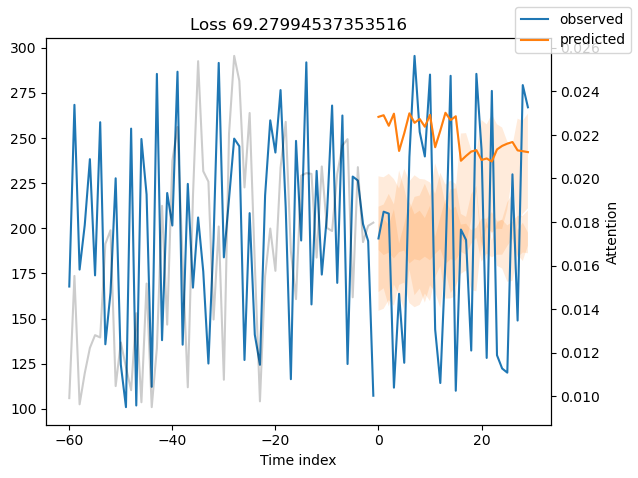

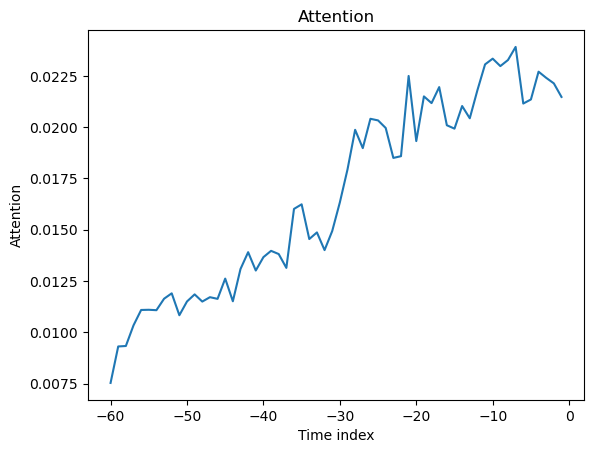

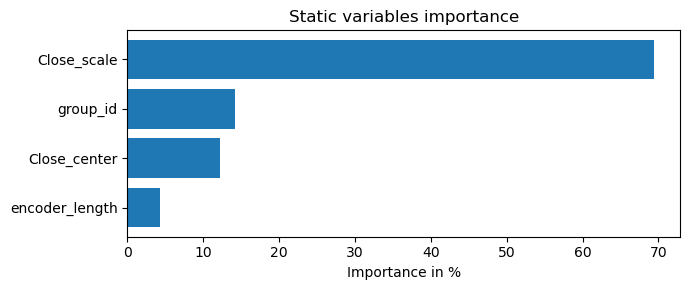

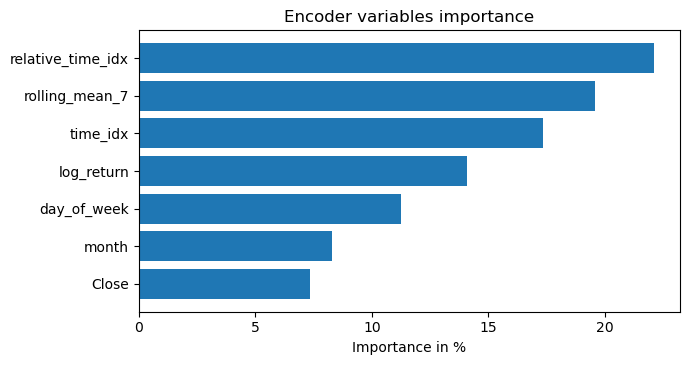

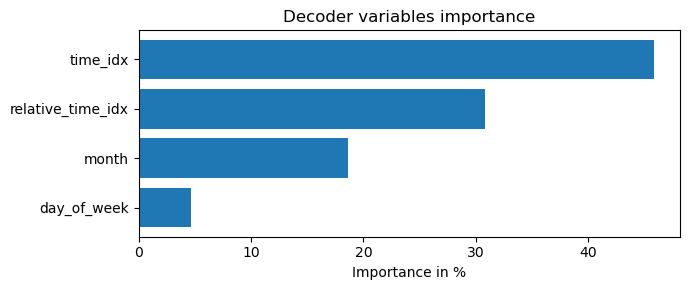

...

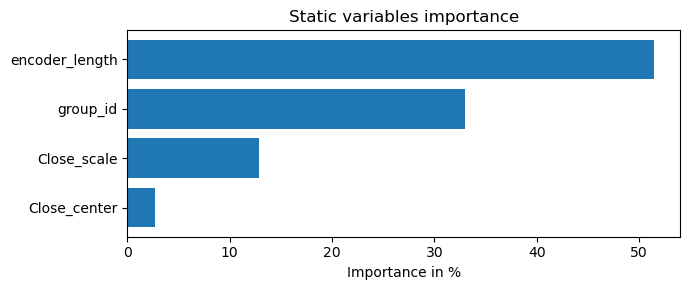

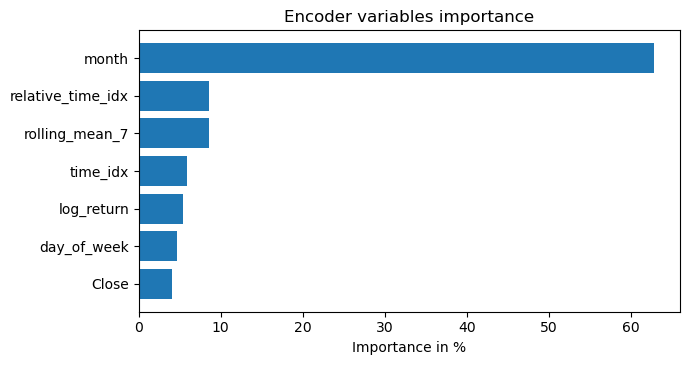

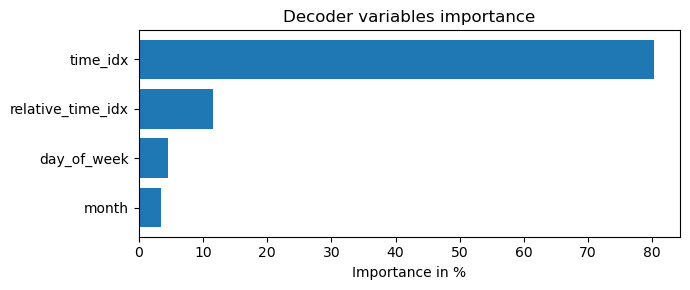

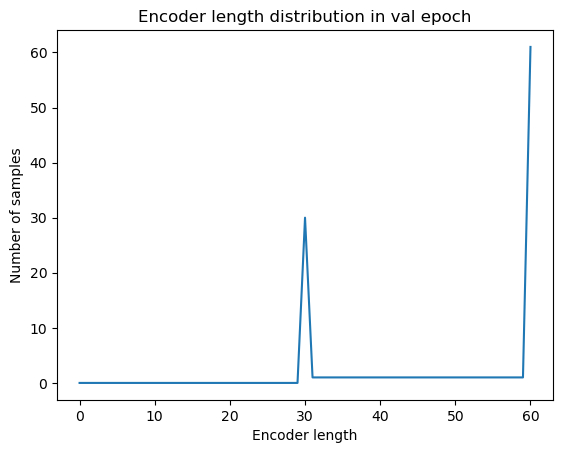

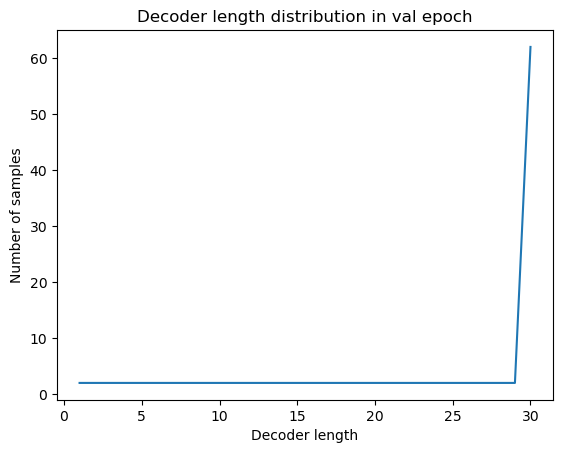

In [6]:
def fit_one_fold(training_dataset, train_loader, val_loader, max_epochs=10):
    early_stop = EarlyStopping(monitor="val_loss", patience=5, mode="min")
    lr_logger = LearningRateMonitor()

    trainer = pl.Trainer(
        max_epochs=max_epochs,
        accelerator="auto",
        gradient_clip_val=0.1,
        callbacks=[lr_logger, early_stop],
        enable_model_summary=False,
        enable_progress_bar=False,
        log_every_n_steps=10,
    )

    tft = TemporalFusionTransformer.from_dataset(
        training_dataset,
        learning_rate=0.03,
        hidden_size=16,
        attention_head_size=1,
        dropout=0.1,
        hidden_continuous_size=8,
        output_size=7,
        loss=QuantileLoss(),
        log_interval=10,
        reduce_on_plateau_patience=3,
    )

    # LR finder (optional). If it ever causes issues, comment this block out and keep lr=0.03.
    tuner = Tuner(trainer)
    lr_finder = tuner.lr_find(
        model=tft,
        train_dataloaders=train_loader,
        val_dataloaders=val_loader,
        min_lr=1e-6,
        max_lr=1.0,
    )
    tft.hparams.learning_rate = lr_finder.suggestion()

    trainer.fit(tft, train_dataloaders=train_loader, val_dataloaders=val_loader)
    return tft


all_fold_overall = []
all_fold_horizon = []

max_idx = int(df["time_idx"].max())

for fold in range(n_folds):
    train_end = initial_train_size + fold * step_size
    val_end = min(train_end + val_window, max_idx)

    if val_end <= train_end + max_prediction_length:
        print(f"Fold {fold}: not enough room for validation windows. Stopping.")
        break

    print(f"\n=== Fold {fold+1}/{n_folds} | train_end={train_end} | val_end={val_end} ===")

    training_dataset, train_loader, val_loader = make_fold_dataloaders(
        df, train_end_idx=train_end, val_end_idx=val_end, batch_size=batch_size
    )

    model = fit_one_fold(training_dataset, train_loader, val_loader, max_epochs=10)

    per_h_df, overall_df = evaluate_multihorizon(model, val_loader)
    overall_df.insert(0, "fold", fold + 1)
    per_h_df.insert(0, "fold", fold + 1)

    all_fold_overall.append(overall_df)
    all_fold_horizon.append(per_h_df)

cv_overall = pd.concat(all_fold_overall, ignore_index=True)
cv_per_horizon = pd.concat(all_fold_horizon, ignore_index=True)

print("\n================ CV OVERALL (per fold) ================")
print(cv_overall)

print("\n================ CV PER-HORIZON (first 15 rows) ================")
print(cv_per_horizon.head(15))

## Training

### CV plots: mean RMSE/MAE vs horizon

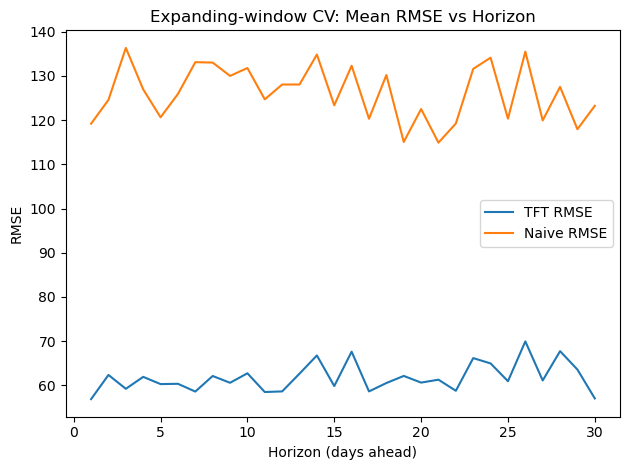

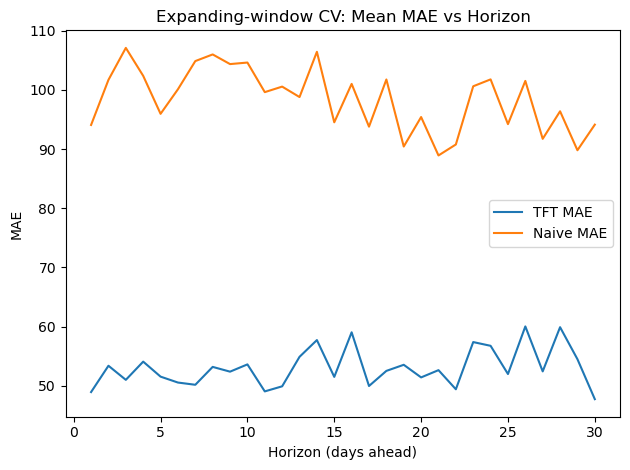

In [7]:
mean_h = cv_per_horizon.groupby("horizon_day", as_index=False).agg({
    "tft_rmse": "mean",
    "naive_rmse": "mean",
    "tft_mae": "mean",
    "naive_mae": "mean",
})

# RMSE vs horizon
plt.figure()
plt.plot(mean_h["horizon_day"], mean_h["tft_rmse"], label="TFT RMSE")
plt.plot(mean_h["horizon_day"], mean_h["naive_rmse"], label="Naive RMSE")
plt.xlabel("Horizon (days ahead)")
plt.ylabel("RMSE")
plt.title("Expanding-window CV: Mean RMSE vs Horizon")
plt.legend()
plt.tight_layout()
plt.show()

# MAE vs horizon
plt.figure()
plt.plot(mean_h["horizon_day"], mean_h["tft_mae"], label="TFT MAE")
plt.plot(mean_h["horizon_day"], mean_h["naive_mae"], label="Naive MAE")
plt.xlabel("Horizon (days ahead)")
plt.ylabel("MAE")
plt.title("Expanding-window CV: Mean MAE vs Horizon")
plt.legend()
plt.tight_layout()
plt.show()


### CV plots: per-fold “spaghetti” RMSE + mean overlay

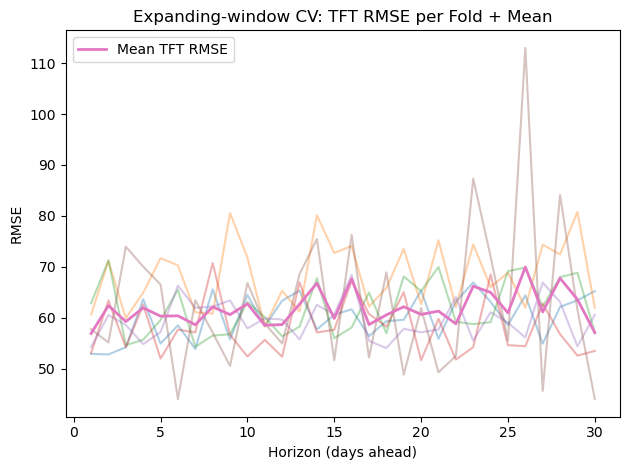

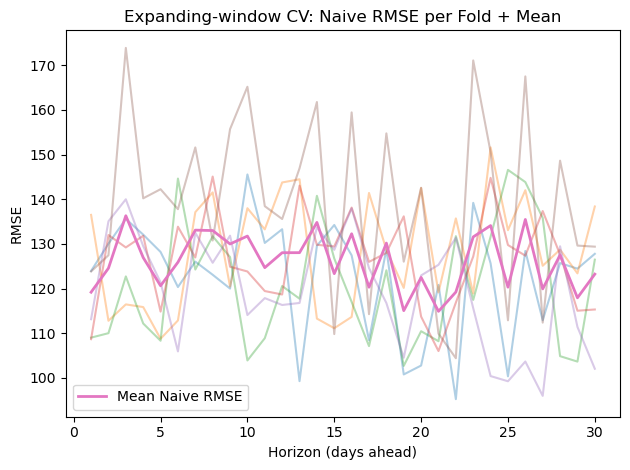

In [8]:
folds = sorted(cv_per_horizon["fold"].unique().tolist())
mean_rmse = cv_per_horizon.groupby("horizon_day", as_index=False)[["tft_rmse", "naive_rmse"]].mean()

# TFT per fold + mean
plt.figure()
for f in folds:
    tmp = cv_per_horizon[cv_per_horizon["fold"] == f]
    plt.plot(tmp["horizon_day"], tmp["tft_rmse"], alpha=0.35)
plt.plot(mean_rmse["horizon_day"], mean_rmse["tft_rmse"], linewidth=2, label="Mean TFT RMSE")
plt.xlabel("Horizon (days ahead)")
plt.ylabel("RMSE")
plt.title("Expanding-window CV: TFT RMSE per Fold + Mean")
plt.legend()
plt.tight_layout()
plt.show()

# Naive per fold + mean
plt.figure()
for f in folds:
    tmp = cv_per_horizon[cv_per_horizon["fold"] == f]
    plt.plot(tmp["horizon_day"], tmp["naive_rmse"], alpha=0.35)
plt.plot(mean_rmse["horizon_day"], mean_rmse["naive_rmse"], linewidth=2, label="Mean Naive RMSE")
plt.xlabel("Horizon (days ahead)")
plt.ylabel("RMSE")
plt.title("Expanding-window CV: Naive RMSE per Fold + Mean")
plt.legend()
plt.tight_layout()
plt.show()


### CV plots: overall RMSE/MAE per fold (bar charts)

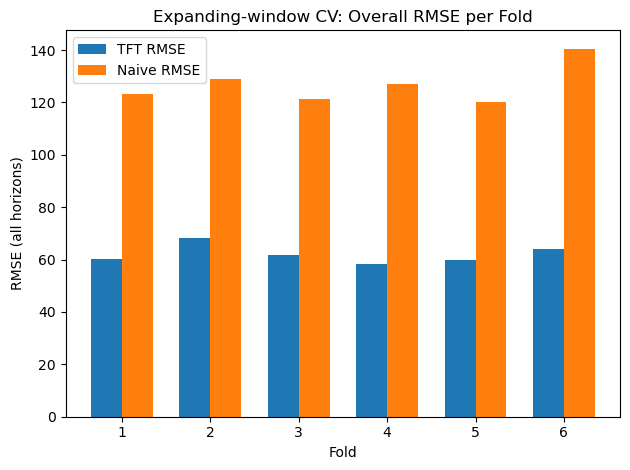

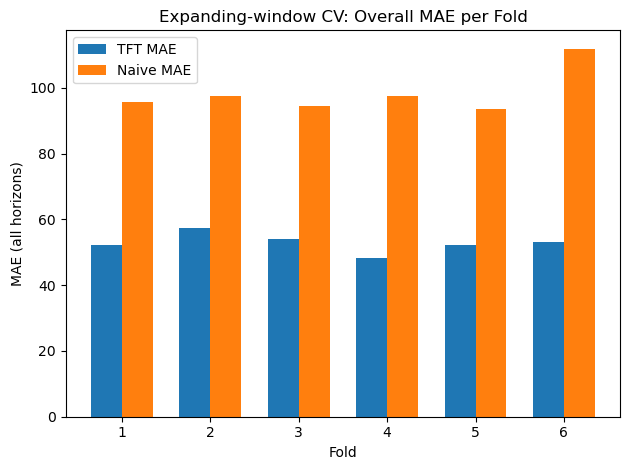

In [9]:
rmse_df = cv_overall[cv_overall["Metric"] == "RMSE"].sort_values("fold")
mae_df  = cv_overall[cv_overall["Metric"] == "MAE"].sort_values("fold")

x = np.arange(len(rmse_df))
w = 0.35

# RMSE bars
plt.figure()
plt.bar(x - w/2, rmse_df["TFT (all horizons)"], w, label="TFT RMSE")
plt.bar(x + w/2, rmse_df["Naive (all horizons)"], w, label="Naive RMSE")
plt.xticks(x, rmse_df["fold"])
plt.xlabel("Fold")
plt.ylabel("RMSE (all horizons)")
plt.title("Expanding-window CV: Overall RMSE per Fold")
plt.legend()
plt.tight_layout()
plt.show()

# MAE bars
plt.figure()
plt.bar(x - w/2, mae_df["TFT (all horizons)"], w, label="TFT MAE")
plt.bar(x + w/2, mae_df["Naive (all horizons)"], w, label="Naive MAE")
plt.xticks(x, mae_df["fold"])
plt.xlabel("Fold")
plt.ylabel("MAE (all horizons)")
plt.title("Expanding-window CV: Overall MAE per Fold")
plt.legend()
plt.tight_layout()
plt.show()


### Train Final Model

In [10]:
final_train_cutoff = df["time_idx"].max() - max_prediction_length
final_train_df = df[df["time_idx"] <= final_train_cutoff].copy()

final_training_dataset = TimeSeriesDataSet(final_train_df, **dataset_kwargs)
final_train_loader = final_training_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)

final_model = TemporalFusionTransformer.from_dataset(
    final_training_dataset,
    learning_rate=0.003,            # keep fixed; avoid LR finder here
    hidden_size=16,
    attention_head_size=1,
    dropout=0.1,
    hidden_continuous_size=8,
    output_size=7,
    loss=QuantileLoss(),
    reduce_on_plateau_patience=3,
)

trainer = pl.Trainer(
    max_epochs=20,
    accelerator="auto",
    gradient_clip_val=0.1,
    enable_model_summary=True,
)

trainer.fit(final_model, train_dataloaders=final_train_loader)


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | QuantileLoss                    | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 108   
3  | prescalers                         | ModuleDict                      | 128   
4  | static_variable_selection          | VariableSelectionNetwork        | 1.8 K 
5  | encoder_variable_selection         | VariableSelectionNetwork        | 3.4 K 
6  | decoder_variable_selection         | VariableSelectionNetwork        | 1.4 K 
7  | static_context_variable_selection  | GatedResidualNetwork            | 1.1 K 
8  | static_

Training: |                                               | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=20` reached.


### Holdout forecast plot (last 30 days): Actual vs TFT vs Naive

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


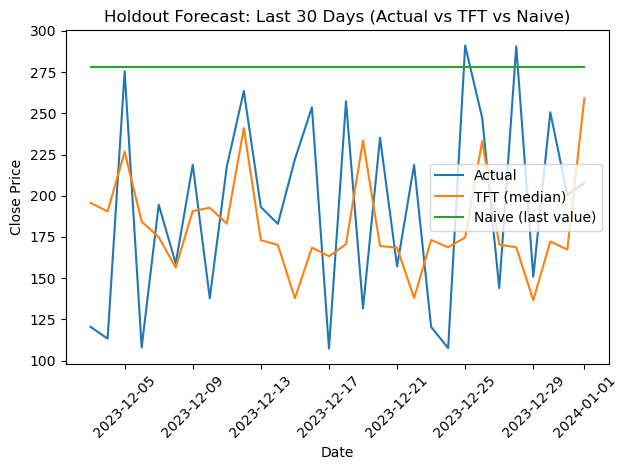

In [11]:
# Build a single-window holdout loader: last available prediction window
holdout_ds = TimeSeriesDataSet.from_dataset(
    final_training_dataset,
    df,
    predict=True,
    stop_randomization=True,
)
holdout_loader = holdout_ds.to_dataloader(train=False, batch_size=1, num_workers=0)

pred_out = final_model.predict(holdout_loader, mode="prediction", return_x=True, return_y=True)

y_pred = pred_out.output.detach().cpu().numpy()[0]  # (horizon,)
y_obj = pred_out.y
y_true = (y_obj[0] if isinstance(y_obj, (tuple, list)) else y_obj).detach().cpu().numpy()[0]

last_val = pred_out.x["encoder_target"][:, -1].detach().cpu().numpy()[0]
y_naive = np.repeat(last_val, len(y_true))

time_idx_future = pred_out.x["decoder_time_idx"].detach().cpu().numpy()[0]
dates_future = df.set_index("time_idx").loc[time_idx_future, "Date"].values

plt.figure()
plt.plot(dates_future, y_true, label="Actual")
plt.plot(dates_future, y_pred, label="TFT (median)")
plt.plot(dates_future, y_naive, label="Naive (last value)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.title("Holdout Forecast: Last 30 Days (Actual vs TFT vs Naive)")
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


### TFT interpretation plots (global importance + attention)

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


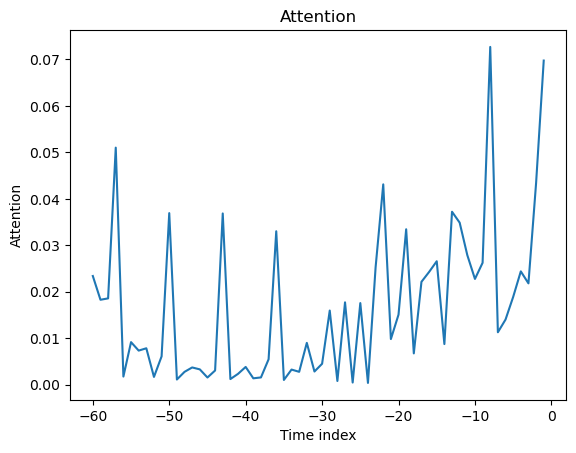

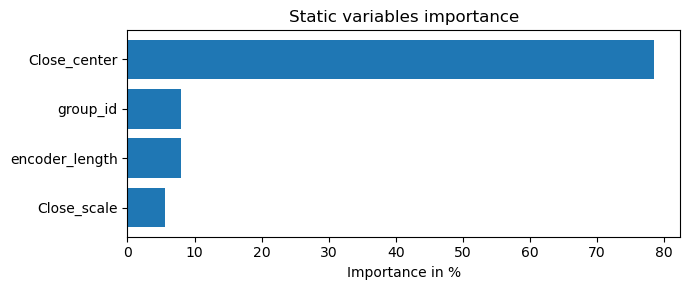

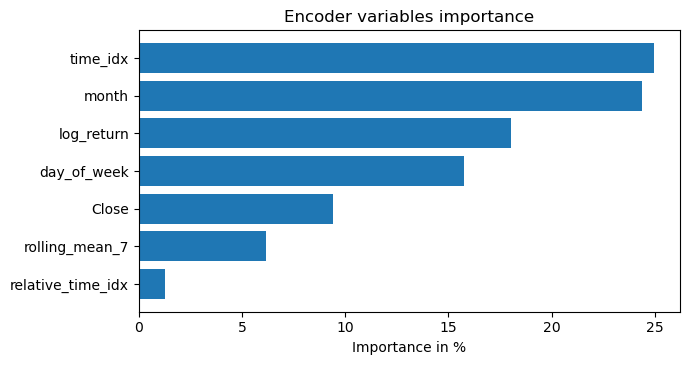

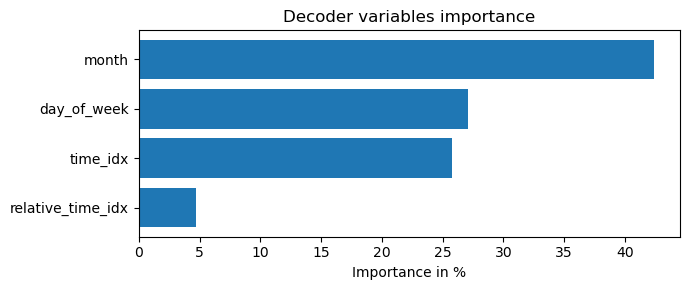

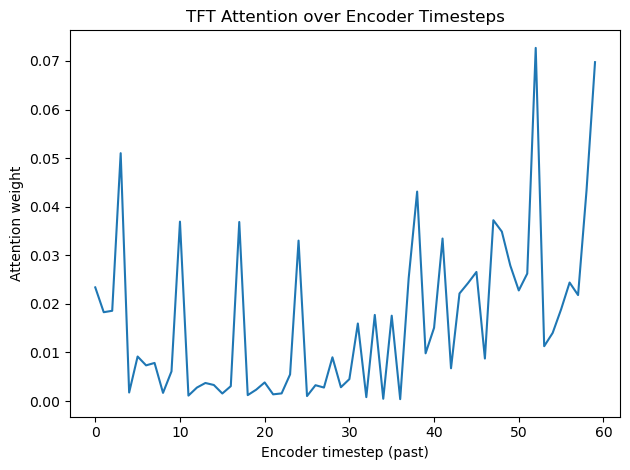

In [12]:
raw_out = final_model.predict(holdout_loader, mode="raw", return_x=True)

interpretation = final_model.interpret_output(raw_out.output, reduction="sum")

# Global variable importance (encoder/decoder/static)
final_model.plot_interpretation(interpretation)
plt.tight_layout()
plt.show()

attention = interpretation["attention"].detach().cpu().numpy()

plt.figure()
plt.plot(attention)
plt.xlabel("Encoder timestep (past)")
plt.ylabel("Attention weight")
plt.title("TFT Attention over Encoder Timesteps")
plt.tight_layout()
plt.show()

### Local explanation: one prediction plot

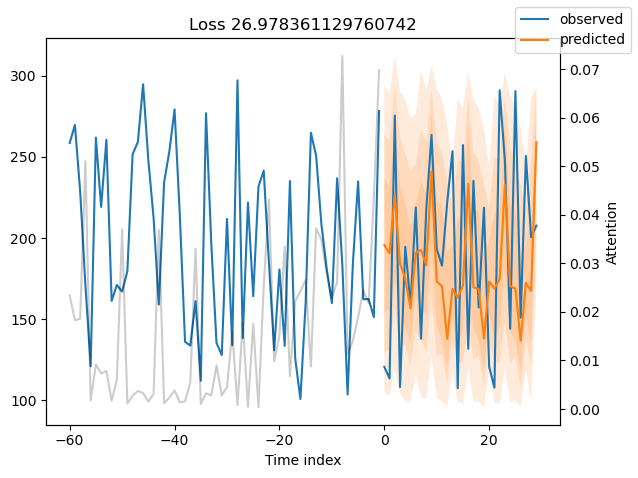

In [13]:
final_model.plot_prediction(raw_out.x, raw_out.output, idx=0, add_loss_to_title=True)
plt.tight_layout()
plt.show()
